# Chapter 13: Models for Object Detection Evaluation

In [ ]:
!pip install transformers ultralytics gitpython timm

## 13.3 Recap

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/data_step1.png)

In [ ]:
from torchvision.datasets import OxfordIIITPet

root_folder = './pets'
pets = OxfordIIITPet(root=root_folder, split='trainval', target_types=['category', 'segmentation'], download=True)

In [ ]:
!wget https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/data/OxfordPets/annotations_val.csv

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/data_step3.png)

In [6]:
import pandas as pd
import torch
from torch.utils.data import DataLoader
from torchvision.transforms.v2 import Compose, Resize, CenterCrop, ToImage, ToDtype, SanitizeBoundingBoxes, Normalize

transform_fn = Compose([
      Resize(size=232, antialias=True),
      CenterCrop(size=(224, 224)),
      ToImage(),
      ToDtype(torch.float32, scale=True),
      SanitizeBoundingBoxes(),
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

/usr/local/lib/python3.10/dist-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https:/

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/data_step4.png)

In [7]:
import os
import pandas as pd
import torch
from torchvision.io import read_image, ImageReadMode
from torchvision.tv_tensors import Image, BoundingBoxes, BoundingBoxFormat, Mask
from torchvision.ops import masks_to_boxes, box_area
from torchvision.datasets import VisionDataset

class ObjDetectionDataset(VisionDataset):
    def __init__(self, image_folder, annotations=None, mask_folder=None, transforms=None):
        super().__init__(image_folder, transforms, None, None)
        # folder where images are stored
        self.image_folder = image_folder
        # path to a CSV file or pandas dataframe with annotations
        self.annotations = annotations
        # folder where masks, if any, are stored
        self.mask_folder = mask_folder
        # transforms/augmentations to be applied to images
        self.transforms = transforms

        # gets the list of all images sorted by name
        self.images = list(sorted(os.listdir(image_folder)))

        self.df_boxes = None
        assert (annotations is not None) or (mask_folder is not None), "At least one, annotations or masks, must be supplied"

        # if a CSV or dataframe was prodivded
        if annotations is not None:
            if isinstance(annotations, str):
                self.df_boxes = pd.read_csv(annotations)
            else:
                self.df_boxes = annotations
            # makes sure the annotations are in the XYXY format
            assert len(set(self.df_boxes.columns).intersection({'filename', 'xmin', 'ymin', 'xmax', 'ymax'})) == 5, "Missing columns in CSV"
            # only annotated images are considered - it overwrites the images attribute
            self.images = self.df_boxes['filename'].unique().tolist()

        self.masks = None
        # if there are masks, makes sure each image has its own mask
        if mask_folder is not None:
            self.masks = list(sorted(os.listdir(mask_folder)))
            assert len(self.masks) == len(self.images), "Every image must have one, and only one, mask"

    def __getitem__(self, idx):
        image_filename = os.path.join(self.image_folder, self.images[idx])
        image_tensor = read_image(image_filename, mode=ImageReadMode.RGB)
        # gets the last two dimensions, height and width
        image_hw = image_tensor.shape[-2:]

        labels = None
        # If there are masks, we work with them
        if self.masks is not None:
            mask_filename = os.path.join(self.mask_folder, self.masks[idx])
            merged_mask = read_image(mask_filename)
            # checks how many instances are present in the mask
            # assumes the first one, zero, is background only
            instances = merged_mask.unique()[1:]

            # splits the merged mask, so there's one mask for instance
            masks = (merged_mask == instances.view(-1, 1, 1))
            # converts masks into boxes
            boxes = masks_to_boxes(masks)
            # uses the datapoints namespace to wrap the masks
            wrapped_masks = Mask(masks)
        # No masks, so we fallback to a DF of annotated boxes
        else:
            # retrieves the annotations for the corresponding image
            annots = self.df_boxes.query(f'filename == "{self.images[idx]}"')
            # keeps only the coordinates
            boxes = torch.as_tensor(annots.dropna()[['xmin', 'ymin', 'xmax', 'ymax']].values)
            # if there are labels available as well, retrieves them
            if 'label' in annots.columns:
                labels = torch.as_tensor(annots.dropna()['label'].values)
            wrapped_masks = None

        # uses the datapoints namespace to wrap the boxes
        wrapped_boxes = BoundingBoxes(boxes, format=BoundingBoxFormat.XYXY, canvas_size=image_hw)
        num_objs = len(boxes)

        if len(boxes):
            if labels is None:
                # if there are no labels, we assume every instance is of
                # the same, and only, class
                labels = torch.ones((num_objs,), dtype=torch.int64)
            area = box_area(wrapped_boxes)
        else:
            # Only background, no boxes
            labels = torch.zeros((0,), dtype=torch.int64)
            area = torch.tensor([0.], dtype=torch.float32)

        # creates a target dictionary with all elements
        target = {
            'boxes': wrapped_boxes,
            'area': area,
            'labels': labels,
            'image_id': torch.tensor([idx+1]),
            'iscrowd': torch.zeros((num_objs,), dtype=torch.int64)
        }
        # if there are masks, includes them
        if wrapped_masks is not None:
            target['masks'] = wrapped_masks

        # uses the datapoints namespace to wrap the image
        image = Image(image_tensor)

        # if there are transformations/augmentations
        # apply them to the image and target
        if self.transforms is not None:
            image, target = self.transforms(image, target)

        return image, target

    def __len__(self):
        return len(self.images)

In [8]:
annotations = {}
datasets = {}

annotations['val'] = pd.read_csv('annotations_val.csv')
datasets['val'] = ObjDetectionDataset(image_folder='./pets/oxford-iiit-pet/images',
                                      annotations=annotations['val'],
                                      transforms=transform_fn)

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/data_step5.png)

In [9]:
dataloaders = {}
dataloaders['val'] = DataLoader(datasets['val'], batch_size=2, shuffle=False, collate_fn=lambda batch: tuple(zip(*batch)))

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step1.png)

In [ ]:
import torch
from torchvision.models.detection import FasterRCNN
from torchvision.models import mobilenet_v2, get_weight
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.ops import MultiScaleRoIAlign

weights = get_weight('MobileNet_V2_Weights.DEFAULT')

num_classes = 38
mobilenet = mobilenet_v2(weights=weights)
new_backbone = mobilenet.features
new_backbone.out_channels = 1280

sizes = ((32, 64, 128, 256, 512),)
aspect_ratios = ((0.5, 1.0, 2.0),)

anchor_generator = AnchorGenerator(sizes=sizes, aspect_ratios=aspect_ratios)

roi_pooler = MultiScaleRoIAlign(featmap_names=['0'], output_size=7, sampling_ratio=2)

model = FasterRCNN(new_backbone,
                   rpn_anchor_generator=anchor_generator,
                   box_roi_pool=roi_pooler,
                   num_classes=num_classes)

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step4.png)

In [ ]:
!wget https://github.com/dvgodoy/assets/releases/download/model/mobilenet_v2_pets.pth

In [12]:
state = torch.load('./mobilenet_v2_pets.pth', map_location='cpu')
model.load_state_dict(state)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidu

## 13.4 Making Predictions

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step5.png)

In [13]:
i = 550
x, y = datasets['val'][i]
model.eval()
images = list(x.unsqueeze(0).to(device))
targets = [{k: v.to(device) for k, v in y.items()}]

pred = model(images, targets)
pred, y['boxes']

([{'boxes': tensor([[ 83.9564,   0.0000, 192.6556,  66.3624],
           [ 85.0811,   0.0000, 187.2319,  67.5424],
           [125.2322,   0.0000, 176.0601,  62.7869],
           [ 77.8933,   0.0000, 217.5908,  76.4040],
           [ 73.6269,   0.0000, 187.1635,  61.4847],
           [  7.3999,   0.0000, 220.1772,  74.1994],
           [ 25.2648,   0.0000, 204.2294,  77.3003]], device='cuda:0',
          grad_fn=<StackBackward0>),
   'labels': tensor([24, 21, 24, 27, 10, 10, 21], device='cuda:0'),
   'scores': tensor([0.7268, 0.2641, 0.2454, 0.0938, 0.0586, 0.0512, 0.0510],
          device='cuda:0', grad_fn=<IndexBackward0>)}],
 BoundingBox([[ 78.9430,   0.0000, 203.3575,  68.8000]], dtype=torch.float64, format=BoundingBoxFormat.XYXY, spatial_size=(224, 224)))

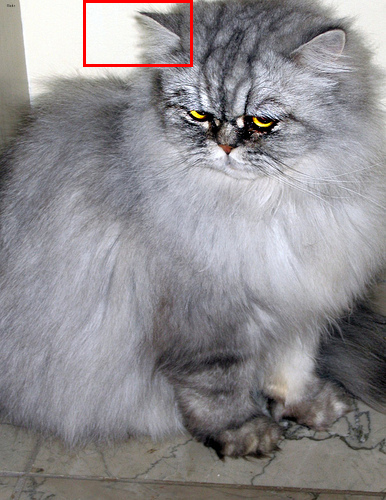

In [14]:
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms import ToPILImage

boxes = pred[0]['boxes'][0].detach().cpu().unsqueeze(0)
img = read_image(f"./pets/oxford-iiit-pet/images/{datasets['val'].images[i]}")
result = draw_bounding_boxes(img, boxes, colors=['red'], width=3)
ToPILImage()(result)

### 13.4.1 Predicted vs Original Boxes

In [15]:
import numpy as np
fname = datasets['val'].images[i]
orig_box = torch.as_tensor(annotations['val'].query(f'filename == "{fname}"').values[0][-4:].astype(np.float32)).unsqueeze(0)
orig_box

tensor([[138.,  10., 345., 178.]])

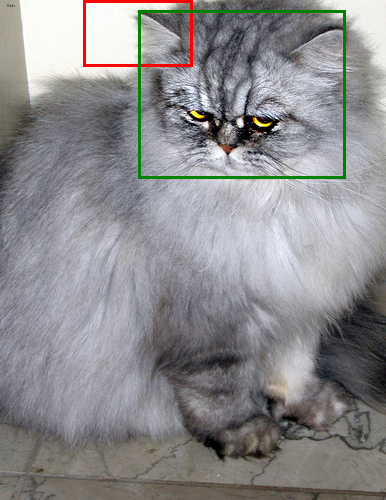

In [16]:
boxes = pred[0]['boxes'][0].detach().cpu().unsqueeze(0)
img = read_image(f"./pets/oxford-iiit-pet/images/{datasets['val'].images[i]}")
result = draw_bounding_boxes(img, torch.cat([boxes, orig_box]), colors=['red', 'green'], width=3)
ToPILImage()(result)

### 13.4.2 Predicted vs Transformed Boxes

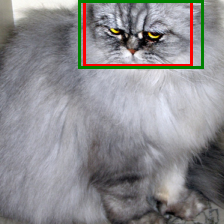

In [17]:
from torchvision.transforms import v2 as transforms

boxes = pred[0]['boxes'][0].detach().cpu().unsqueeze(0)
img = read_image(f"./pets/oxford-iiit-pet/images/{datasets['val'].images[i]}")
img = transforms.Compose([transforms.Resize(232, antialias=True), transforms.CenterCrop(224)])(img)
result = draw_bounding_boxes(img, torch.cat([boxes, y['boxes']]), colors=['red', 'green'], width=3)
ToPILImage()(result)

### 13.4.3 Postprocessing Boxes

In [18]:
from torchvision.models.detection.transform import resize_boxes

def restore_boxes(orig_image_dims, transf_image_dims, boxes):
    is_wide = (orig_image_dims [1] >= orig_image_dims[0])
    shortest = min(orig_image_dims)
    longest = max(orig_image_dims)
    shift = (longest-shortest)/2
    if is_wide:
        shift = torch.as_tensor([shift, 0, shift, 0])
    else:
        shift = torch.as_tensor([0, shift, 0, shift])

    # if it's a perfect square, we assume it was cropped that size
    is_cropped = (transf_image_dims[0] == transf_image_dims[1])
    boxes = resize_boxes(boxes, transf_image_dims, (shortest, shortest) if is_cropped else orig_image_dims)

    ratio = longest/shortest
    is_square = (abs(ratio - 1) < 0.01)
    if not is_square:
        boxes += shift
    return boxes

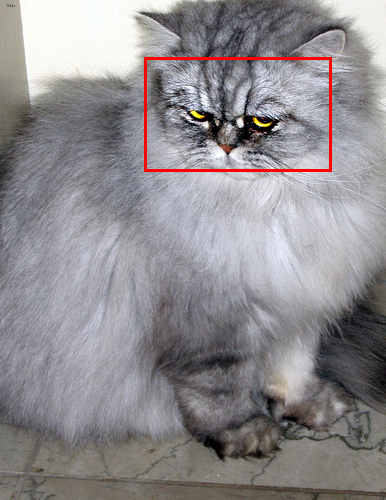

In [19]:
img = read_image(f"./pets/oxford-iiit-pet/images/{datasets['val'].images[i]}")
orig_image_dims = img.shape[1:]
transf_image_dims = x.shape[1:]
boxes = pred[0]['boxes'][0].detach().cpu().unsqueeze(0)
boxes = restore_boxes(orig_image_dims, transf_image_dims, boxes)

result = draw_bounding_boxes(img, boxes, colors=['red']*boxes.shape[0], width=3)
ToPILImage()(result)

## 13.5 Evaluation

In [ ]:
!wget https://raw.githubusercontent.com/pytorch/vision/v0.15.2/references/detection/coco_eval.py
!wget https://raw.githubusercontent.com/pytorch/vision/v0.15.2/references/detection/transforms.py
!wget https://raw.githubusercontent.com/pytorch/vision/v0.15.2/references/detection/utils.py && mv utils.py detection_utils.py
!wget https://raw.githubusercontent.com/pytorch/vision/v0.15.2/references/detection/engine.py
!wget https://raw.githubusercontent.com/pytorch/vision/v0.15.2/references/detection/coco_utils.py
!sed -i 's/import utils/import detection_utils as utils/' engine.py
!sed -i 's/import utils/import detection_utils as utils/' coco_eval.py

In [21]:
from engine import evaluate as torch_coco_eval
torch_coco_eval(model, dataloaders['val'], device=device)

creating index...
index created!
Test:  [  0/340]  eta: 0:00:50  model_time: 0.1202 (0.1202)  evaluator_time: 0.0094 (0.0094)  time: 0.1476  data: 0.0174  max mem: 1607
Test:  [100/340]  eta: 0:00:20  model_time: 0.0525 (0.0579)  evaluator_time: 0.0034 (0.0052)  time: 0.0743  data: 0.0164  max mem: 1607
Test:  [200/340]  eta: 0:00:11  model_time: 0.0547 (0.0566)  evaluator_time: 0.0042 (0.0055)  time: 0.0813  data: 0.0205  max mem: 1607
Test:  [300/340]  eta: 0:00:03  model_time: 0.0550 (0.0566)  evaluator_time: 0.0035 (0.0051)  time: 0.0776  data: 0.0158  max mem: 1607
Test:  [339/340]  eta: 0:00:00  model_time: 0.0524 (0.0564)  evaluator_time: 0.0034 (0.0050)  time: 0.0756  data: 0.0182  max mem: 1607
Test: Total time: 0:00:27 (0.0821 s / it)
Averaged stats: model_time: 0.0524 (0.0564)  evaluator_time: 0.0034 (0.0050)
Accumulating evaluation results...
DONE (t=0.59s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.354
 Average Precision  

### 13.5.2 Metrics

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch12/prec_rec.png)

#### 13.5.2.1 Precision-Recall under COCO

In [22]:
iouThrs = np.linspace(.5, 0.95, int(np.round((0.95 - .5) / .05)) + 1, endpoint=True)
iouThrs

array([0.5 , 0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95])

#### 13.5.2.3 Average Precision (AP)

In [23]:
recThrs = np.linspace(.0, 1.00, int(np.round((1.00 - .0) / .01)) + 1, endpoint=True)
recThrs

array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
       0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
       0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
       0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54,
       0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65,
       0.66, 0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76,
       0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87,
       0.88, 0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98,
       0.99, 1.  ])

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch12/map.png)

### 13.5.3 COCO Evaluation

#### 13.5.3.1 Annotations (optional)

In [24]:
import json
from torchvision.ops import box_convert

def generate_coco_annotations(batch, classes, filenames):
    images = []
    annotations = []
    annot_id = 1
    for i, (image, targets) in enumerate(zip(*batch)):
        height, width = image.shape[1:]
        filename = filenames[targets['image_id']-1]
        images.append({'id': targets['image_id'].item(),
                       'file_name': filename,
                       'height': height,
                       'width': width})
        boxes = []
        for box, label, area in zip(targets['boxes'], targets['labels'], targets['area']):
            # Converts boxes from Pascal VOC to COCO format
            box = box_convert(box, 'xyxy', 'xywh')
            boxes.append({'id': annot_id,
                          'image_id': targets['image_id'].item(),
                          'category_id': label.item(),
                          'bbox': box.tolist(),
                          'area': area.item(),
                          'iscrowd': 0})
            annot_id += 1
        annotations.extend(boxes)

    categories = [{"id": i,
                   "name": cat,
                   "supercategory": None}
                  for i, cat in enumerate(classes)]

    annotations = {
        "info": '',
        "licenses": [],
        "categories": categories,
        "images": images,
        "annotations": annotations
    }
    return annotations

In [25]:
from pycocotools.coco import COCO

def generate_coco_ground_truth(batch, classes, filenames):
    annotations = generate_coco_annotations(batch, classes, filenames)
    ground_truth = COCO()
    ground_truth.dataset = annotations
    ground_truth.createIndex()
    return ground_truth

In [26]:
from pycocotools.cocoeval import COCOeval

def evaluate(batch, predictions, ground_truth):
    x_batch, y_batch = batch

    res = [{'image_id': tgt['image_id'].item(),
            'bbox': box_convert(box, 'xyxy', 'xywh').tolist(),
            'score': score.item(),
            'category_id': label.item()}
           for img, tgt in zip(predictions, y_batch)
           for box, score, label in zip(img['boxes'], img['scores'], img['labels'])]

    predicted_boxes = ground_truth.loadRes(res)
    evaluation = COCOeval(ground_truth, predicted_boxes, 'bbox')
    evaluation.params.imgIds = [tgt['image_id'].item() for tgt in y_batch]
    evaluation.evaluate()
    evaluation.accumulate()
    evaluation.summarize()
    return evaluation

#### 13.5.3.2 Dummy Example (optional)

In [27]:
def gen_dummy_data(n_images, img_size=224, box_size=50):
    dummy_x = torch.randn(n_images, 3, img_size, img_size)
    dummy_y = [
        {'boxes': torch.tensor([[0., 0., box_size, box_size]]), # XYXY
         'area': torch.tensor([box_size**2]),
         'labels': torch.tensor([0]),
         'image_id': torch.tensor([i]),
         'iscrowd': torch.tensor([0])} for i in range(1, n_images+1)]

    dummy_fnames = [f'image{i}' for i in range(1, n_images+1)]
    dummy_cats = ['cat1', 'cat2']
    return (dummy_x, dummy_y), dummy_cats, dummy_fnames

(dummy_x, dummy_y), dummy_cats, dummy_fnames  = gen_dummy_data(5, 224, 100)
dummy_y[:1]

[{'boxes': tensor([[  0.,   0., 100., 100.]]),
  'area': tensor([10000]),
  'labels': tensor([0]),
  'image_id': tensor([1]),
  'iscrowd': tensor([0])}]

In [28]:
dummy_ground_truth = generate_coco_ground_truth((dummy_x, dummy_y), dummy_cats, dummy_fnames)

creating index...
index created!


In [29]:
def gen_dummy_pred(dummy_y, n_detections, n_correct_classes, target_iou=1.0, add_extra_boxes=False):
    n_images = len(dummy_y)
    size = torch.sqrt(dummy_y[0]['area']*target_iou).ceil()

    if add_extra_boxes:
        dummy_pred = [
            {'boxes': torch.tensor([[0., 0., size, size], [size, size, size*2, size*2]]) if n_detections >= i else torch.tensor([]), # XYXY
             'labels': torch.tensor([0 if n_correct_classes >= i else 1] + [0]) if n_detections >= i else torch.tensor([]),
             'scores': torch.tensor([1., 1.]) if n_detections >= i else torch.tensor([])}
            for i in range(1, n_images+1)]
    else:
        dummy_pred = [
            {'boxes': torch.tensor([[0., 0., size, size]]) if n_detections >= i else torch.tensor([]), # XYXY
             'labels': torch.tensor([0 if n_correct_classes >= i else 1]) if n_detections >= i else torch.tensor([]),
             'scores': torch.tensor([1.]) if n_detections >= i else torch.tensor([])}
            for i in range(1, n_images+1)]
    return dummy_pred

In [30]:
n_detections = 5
n_correct_classes = 5
target_iou = 1.0
extra_boxes = False

dummy_pred = gen_dummy_pred(dummy_y, n_detections, n_correct_classes, target_iou, extra_boxes)

if n_detections > 0:
    evaluate((dummy_x, dummy_y), dummy_pred, dummy_ground_truth)

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 1.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=

## 13.6 YOLO

### 13.6.1 Torch Hub

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')
model

In [32]:
model.names.values()

dict_values(['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'])

### 13.6.2 Running Inference

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step5.png)

In [ ]:
!wget https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch12/azorean_ducks.jpg

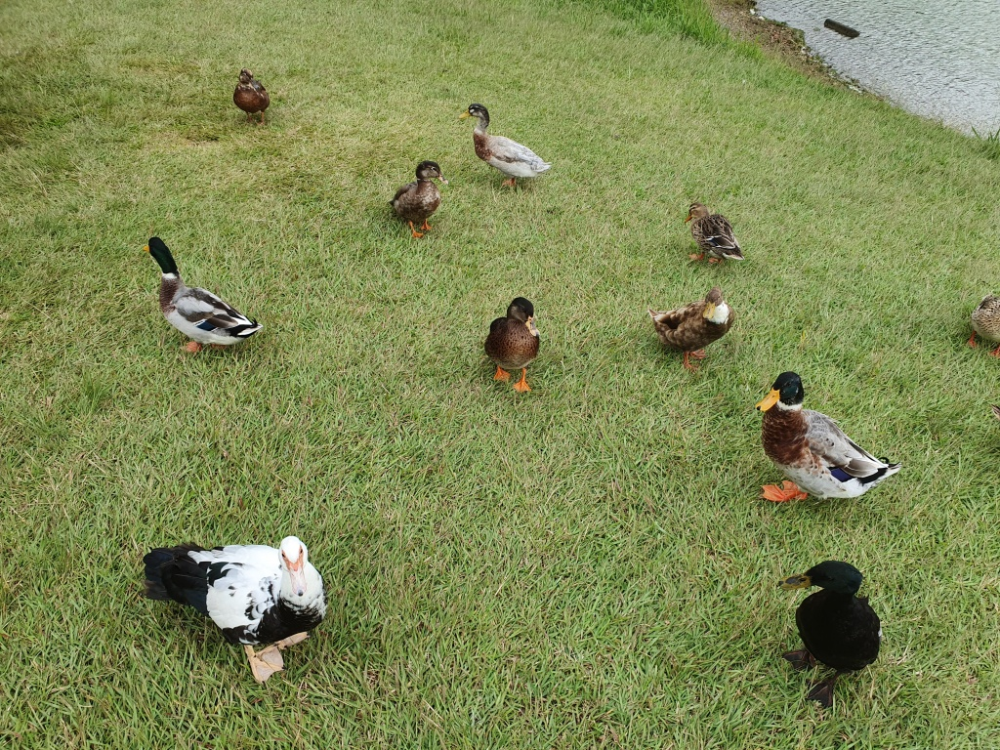

In [35]:
import PIL
fname = 'azorean_ducks.jpg'
PIL.Image.open(fname)

In [36]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)
res = model(fname)
res

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 768x1024 11 birds
Speed: 106.1ms pre-process, 130.5ms inference, 5.9ms NMS per image at shape (1, 3, 480, 640)

In [37]:
res_df = res.pandas().xyxy[0]
res_df

,xmin,ymin,xmax,ymax,confidence,class,name
0,770.762573,379.474121,922.438416,514.164978,0.901067,14,bird
1,662.241638,291.741913,753.534302,386.859772,0.887570,14,bird
2,398.664276,164.318115,455.256256,246.682861,0.875714,14,bird
3,496.517395,303.836884,553.934021,404.550537,0.870381,14,bird
4,797.630981,572.575867,904.755981,731.132507,0.865559,14,bird
5,150.298416,240.086777,267.050629,361.535858,0.863830,14,bird
6,469.186523,102.259750,566.652954,199.592438,0.862907,14,bird
7,700.979187,206.670273,763.856323,272.910004,0.832532,14,bird
8,238.057785,70.111938,275.661255,128.427521,0.763460,14,bird
9,143.544693,550.695984,334.303436,700.674011,0.700639,14,bird


In [38]:
boxes = res.xyxy[0][:, :4]
boxes

tensor([[ 770.76257,  379.47412,  922.43842,  514.16498],
        [ 662.24164,  291.74191,  753.53430,  386.85977],
        [ 398.66428,  164.31812,  455.25626,  246.68286],
        [ 496.51740,  303.83688,  553.93402,  404.55054],
        [ 797.63098,  572.57587,  904.75598,  731.13251],
        [ 150.29842,  240.08678,  267.05063,  361.53586],
        [ 469.18652,  102.25975,  566.65295,  199.59244],
        [ 700.97919,  206.67027,  763.85632,  272.91000],
        [ 238.05779,   70.11194,  275.66125,  128.42752],
        [ 143.54469,  550.69598,  334.30344,  700.67401],
        [ 987.21478,  300.28348, 1023.53546,  367.01825]], device='cuda:0')

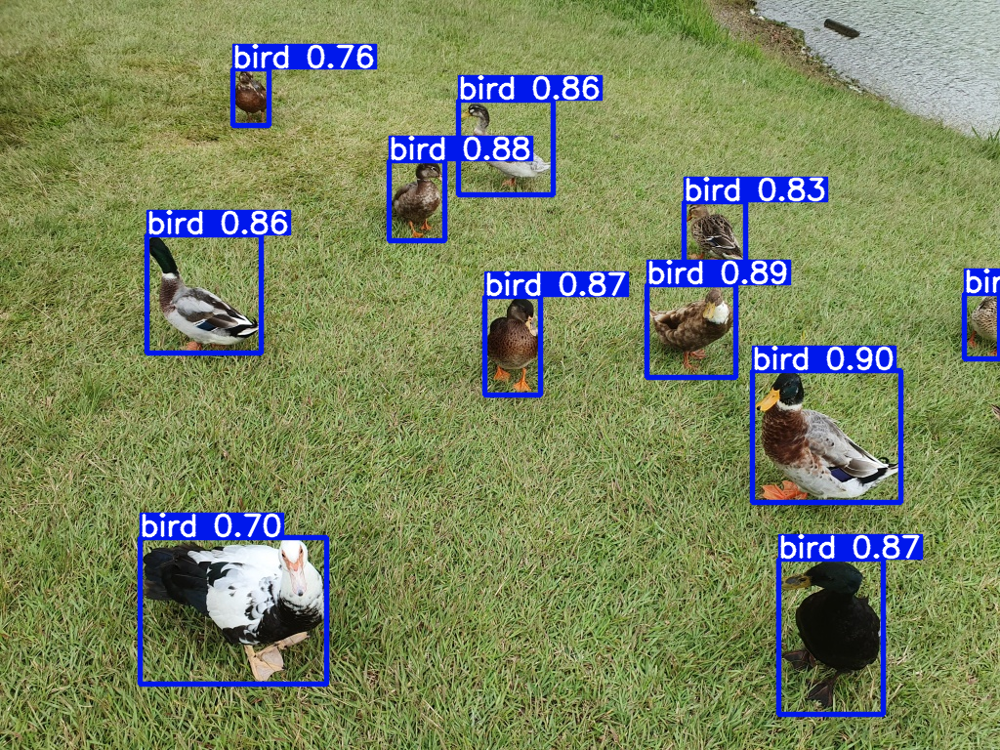

In [39]:
imgs_with_boxes = res.render()
PIL.Image.fromarray(imgs_with_boxes[0])

## 13.7 HuggingFace Pipelines for Object Detection

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step5.png)

In [40]:
from transformers import pipeline

device = 0 if torch.cuda.is_available() else -1
detector = pipeline(model="facebook/detr-resnet-50", task="object-detection", device=device)
res = detector("azorean_ducks.jpg")
res

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


[{'score': 0.9894874095916748,
  'label': 'bird',
  'box': {'xmin': 144, 'ymin': 546, 'xmax': 336, 'ymax': 704}},
 {'score': 0.9992701411247253,
  'label': 'bird',
  'box': {'xmin': 496, 'ymin': 303, 'xmax': 553, 'ymax': 406}},
 {'score': 0.9988422989845276,
  'label': 'bird',
  'box': {'xmin': 769, 'ymin': 380, 'xmax': 924, 'ymax': 515}},
 {'score': 0.9970906972885132,
  'label': 'bird',
  'box': {'xmin': 790, 'ymin': 574, 'xmax': 905, 'ymax': 725}},
 {'score': 0.9844100475311279,
  'label': 'bird',
  'box': {'xmin': 992, 'ymin': 303, 'xmax': 1023, 'ymax': 360}},
 {'score': 0.9985462427139282,
  'label': 'bird',
  'box': {'xmin': 472, 'ymin': 105, 'xmax': 566, 'ymax': 197}},
 {'score': 0.9976732134819031,
  'label': 'bird',
  'box': {'xmin': 700, 'ymin': 208, 'xmax': 765, 'ymax': 275}},
 {'score': 0.9973702430725098,
  'label': 'bird',
  'box': {'xmin': 399, 'ymin': 163, 'xmax': 457, 'ymax': 247}},
 {'score': 0.9979994893074036,
  'label': 'bird',
  'box': {'xmin': 238, 'ymin': 67, 'x

In [41]:
boxes = torch.as_tensor([list(v['box'].values()) for v in res])
boxes

tensor([[ 144,  546,  336,  704],
        [ 496,  303,  553,  406],
        [ 769,  380,  924,  515],
        [ 790,  574,  905,  725],
        [ 992,  303, 1023,  360],
        [ 472,  105,  566,  197],
        [ 700,  208,  765,  275],
        [ 399,  163,  457,  247],
        [ 238,   67,  275,  125],
        [ 144,  240,  269,  362],
        [ 661,  298,  753,  382]])

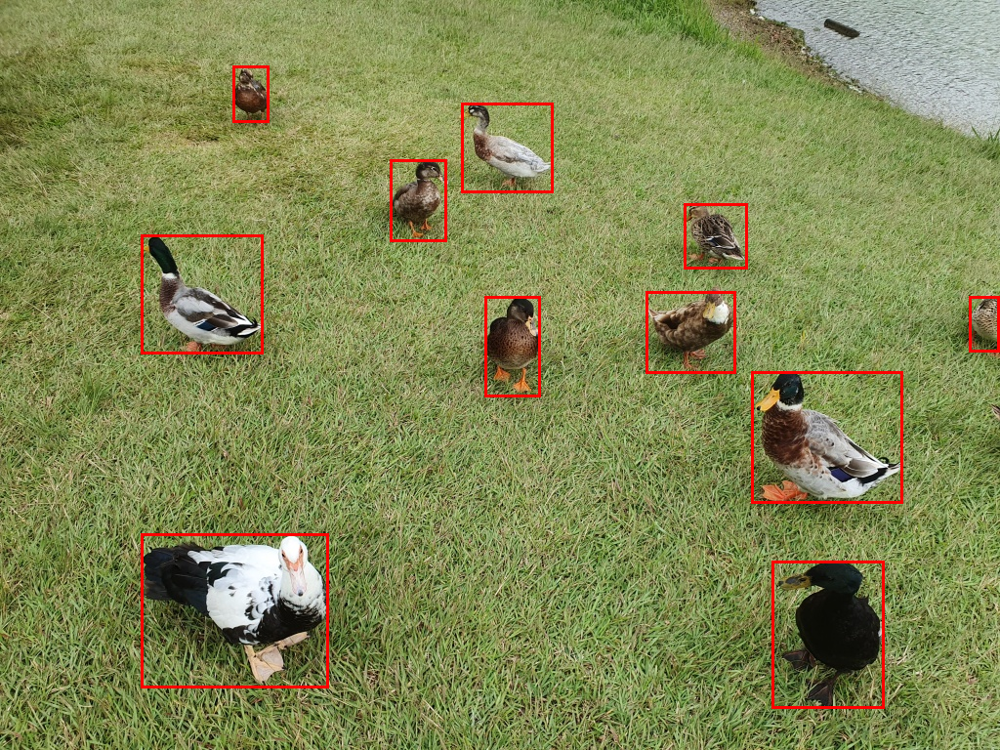

In [42]:
from torchvision.utils import draw_bounding_boxes

img = read_image('azorean_ducks.jpg')
result = draw_bounding_boxes(img, boxes, colors=['red']*len(boxes), width=3)
ToPILImage()(result)

In [43]:
detector.model.config.id2label.values()

dict_values(['N/A', 'person', 'traffic light', 'fire hydrant', 'street sign', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'bicycle', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack', 'umbrella', 'shoe', 'car', 'eye glasses', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'motorcycle', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'plate', 'wine glass', 'cup', 'fork', 'knife', 'airplane', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'bus', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'mirror', 'dining table', 'window', 'desk', 'train', 'toilet', 'door', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'truck', 'toaster', 'sink', 'refrigerator', 'blender', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'boat', 'toothbrush'])

## 13.8 Zero-Shot Object Detection

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch0/model_step5.png)

In [ ]:
device = 0 if torch.cuda.is_available() else -1
zero_detector = pipeline(model="google/owlvit-base-patch32", task="zero-shot-object-detection", device=device)

In [45]:
res = zero_detector('azorean_ducks.jpg', candidate_labels=['duck', 'goose'])
res

([{'score': 0.46747010946273804,
   'label': 'duck',
   'box': {'xmin': 765, 'ymin': 382, 'xmax': 927, 'ymax': 520}},
  {'score': 0.4318367540836334,
   'label': 'goose',
   'box': {'xmin': 398, 'ymin': 163, 'xmax': 453, 'ymax': 243}},
  {'score': 0.41968658566474915,
   'label': 'duck',
   'box': {'xmin': 142, 'ymin': 233, 'xmax': 272, 'ymax': 368}},
  {'score': 0.41503116488456726,
   'label': 'duck',
   'box': {'xmin': 659, 'ymin': 291, 'xmax': 756, 'ymax': 382}},
  {'score': 0.41497698426246643,
   'label': 'goose',
   'box': {'xmin': 665, 'ymin': 291, 'xmax': 753, 'ymax': 380}},
  {'score': 0.41335687041282654,
   'label': 'duck',
   'box': {'xmin': 468, 'ymin': 102, 'xmax': 568, 'ymax': 198}},
  {'score': 0.4102725088596344,
   'label': 'goose',
   'box': {'xmin': 472, 'ymin': 105, 'xmax': 567, 'ymax': 195}},
  {'score': 0.39043134450912476,
   'label': 'goose',
   'box': {'xmin': 145, 'ymin': 234, 'xmax': 267, 'ymax': 365}},
  {'score': 0.3902215361595154,
   'label': 'goose',
 

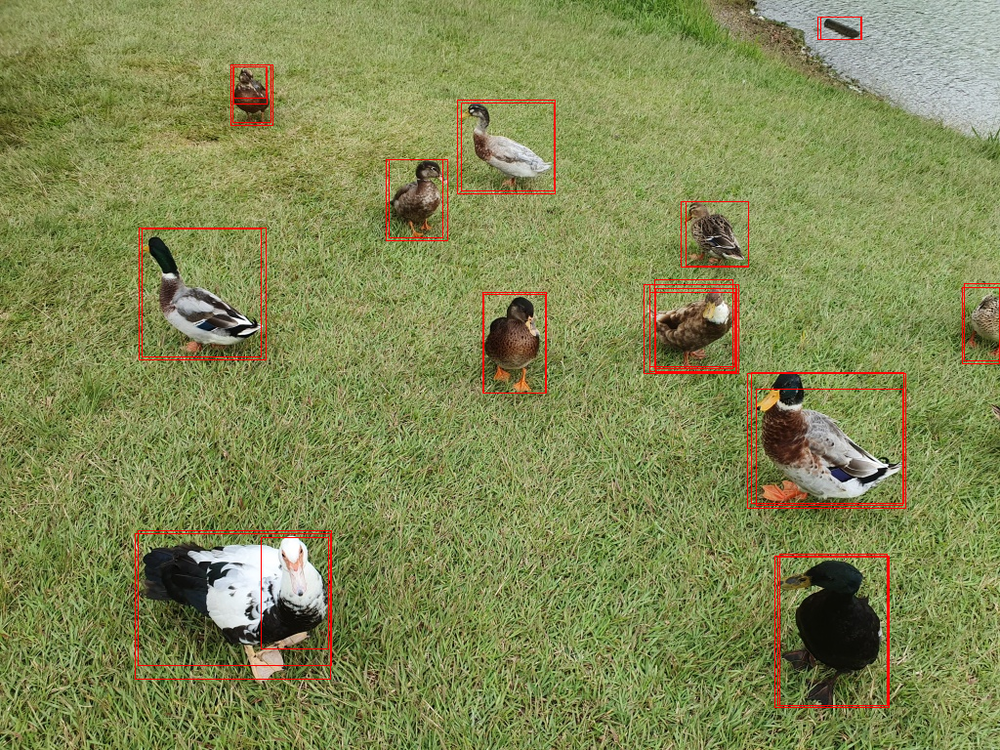

In [46]:
boxes = torch.as_tensor([list(v['box'].values()) for v in res])

img = read_image('azorean_ducks.jpg')
result = draw_bounding_boxes(img, boxes, colors=['red']*len(boxes), width=1)
ToPILImage()(result)

In [47]:
from torchvision.ops import nms

scores = torch.as_tensor([v['score'] for v in res])
box_indices = nms(boxes.float(), scores, iou_threshold=0.1)
box_indices

tensor([ 0,  1,  2,  3,  5,  8,  9, 11, 14, 23, 24, 26])

In [48]:
kept_boxes = boxes[box_indices]
kept_boxes

tensor([[ 765,  382,  927,  520],
        [ 398,  163,  453,  243],
        [ 142,  233,  272,  368],
        [ 659,  291,  756,  382],
        [ 468,  102,  568,  198],
        [ 702,  206,  766,  272],
        [ 495,  301,  558,  402],
        [ 238,   66,  277,  125],
        [ 141,  543,  339,  681],
        [ 837,   17,  881,   40],
        [ 798,  567,  908,  722],
        [ 985,  294, 1023,  372]])

In [49]:
labels = np.array([v['label'] for v in res])
kept_labels = labels[box_indices]
kept_labels

array(['duck', 'goose', 'duck', 'duck', 'duck', 'goose', 'goose', 'goose', 'goose', 'goose', 'goose', 'goose'], dtype='<U5')

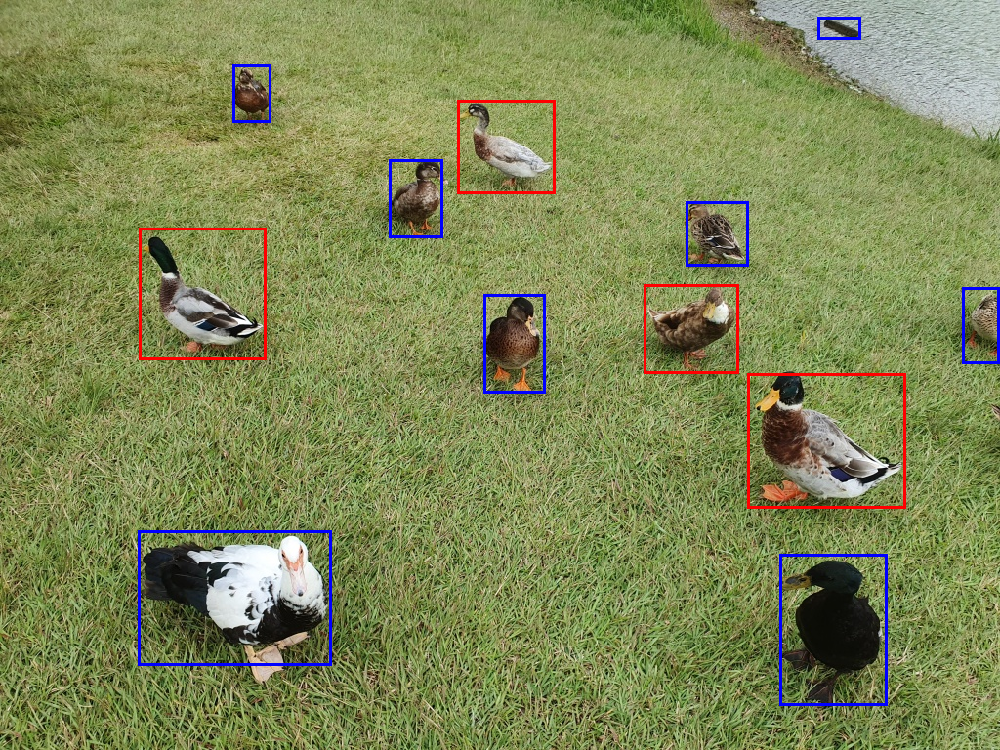

In [50]:
img = read_image('azorean_ducks.jpg')
result = draw_bounding_boxes(img, kept_boxes, colors=['red' if v == 'duck' else 'blue' for v in kept_labels], width=3)
ToPILImage()(result)

### 13.8.1 Grounding Dino

![](https://raw.githubusercontent.com/dvgodoy/assets/main/PyTorchInPractice/images/ch12/dino_ducks.png)